In [70]:
import pandas as pd
import numpy as np

house = pd.read_csv("/Users/josemontoro/data/personal/springboard/Capstone/house_prices/house-prices-advanced-regression-techniques/train.csv")


# Set ipython's max row display
pd.set_option('display.max_row', 1000)

# Set iPython's max column width to 100
pd.set_option('display.max_columns', 100)

In [71]:
# For the rows that have true missing values (MCAR), in Electrical, BsmtFinType2, BsmtExposure, we'll input the most common values

house.at[1379,'Electrical'] = 'SBrkr'
house.at[332, 'BsmtFinType2'] = 'Unf'
house.loc[948, 'BsmtExposure'] = 'Av'


In [72]:
## Converting the identified missing values as necessary

# Converting numerical missing values to 0
filled = house.copy(deep=True)
filled[['LotFrontage', 'MasVnrArea']] = filled[['LotFrontage', 'MasVnrArea']].fillna(value=0)


In [73]:
# Converting the text missing values to 'None'

cols = ['PoolQC',
'MiscFeature',
'Alley',
'Fence',
'FireplaceQu',
'GarageCond',
'GarageType',
'GarageQual',
'GarageFinish',
'GarageYrBlt',
'MasVnrType',
'BsmtExposure',
'BsmtFinType2',
'BsmtCond',
'BsmtQual',
'BsmtFinType1'
]

filled[cols] = filled[cols].fillna(value='None')


In [74]:
## Data Visualization starts here
viz = filled.copy()

In [75]:
import seaborn as sns
import matplotlib.pyplot as plt

In [76]:
viz.shape
# How many observations and variables do we have?

(1460, 81)

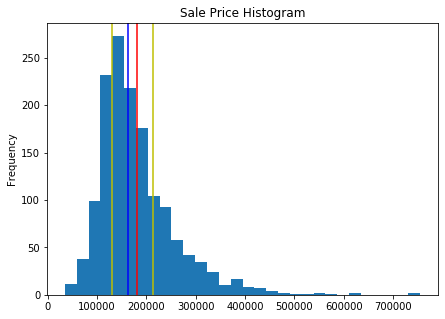

In [77]:
viz['SalePrice'].plot(kind='hist', bins=30, title='Sale Price Histogram', figsize=[7,5])
plt.axvline(viz.SalePrice.mean(), color='r', label='Mean')
plt.axvline(viz.SalePrice.median(), color='b', label='Median')
plt.axvline(viz.SalePrice.quantile(.25), color='y', label='25% Quantile')
plt.axvline(viz.SalePrice.quantile(.75), color='y', label='75% Quantile')
# Distribution of Sale Price

In [78]:
# Min and max of SalePrice
print("The cheapest house costs ${} and the most expensive one costs ${}".format(viz.SalePrice.min(), viz.SalePrice.max()))

The cheapest house costs $34900 and the most expensive one costs $755000


In [79]:
viz.SalePrice.describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

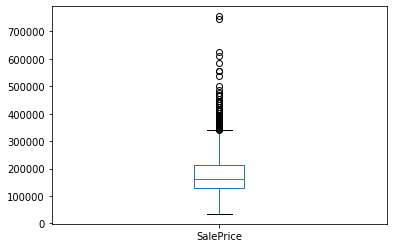

In [80]:
viz.SalePrice.plot(kind="box")

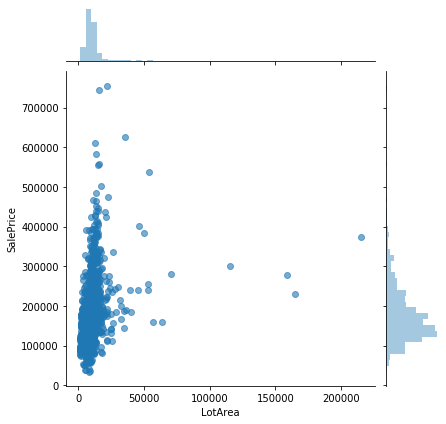

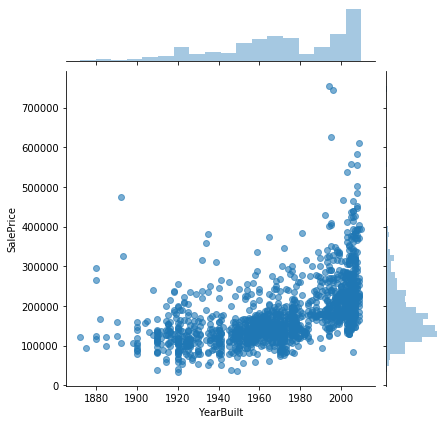

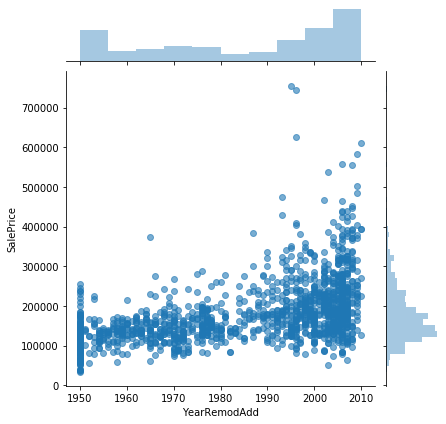

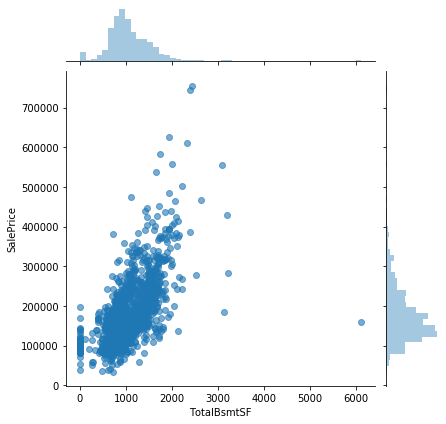

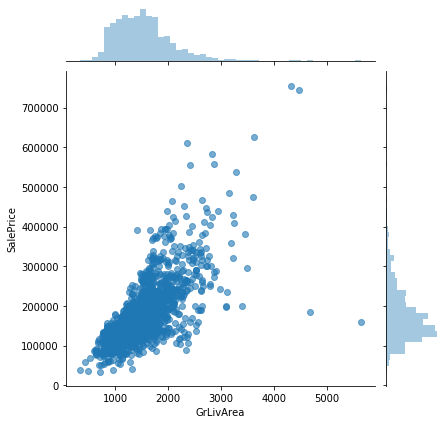

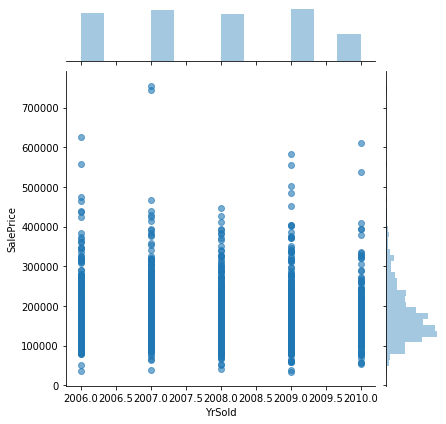

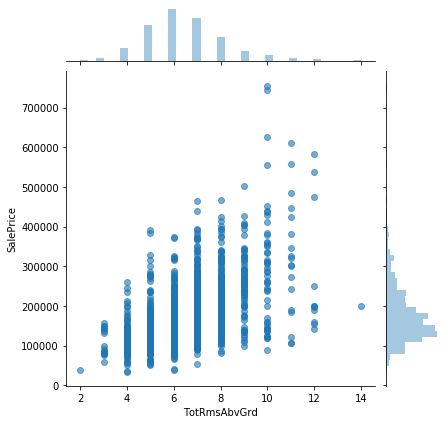

In [81]:
# Scatter plots
cols = ['LotArea', 'YearBuilt', 'YearRemodAdd', 'TotalBsmtSF', 'GrLivArea', 'YrSold', 'TotRmsAbvGrd']
for col in cols:
    sns.jointplot(data=viz, x=col,y='SalePrice', alpha=0.6)
    plt.show()


### Scatter Plots

_Testing the relationship between two numerical variables_

There seem to be correlations between 'SalePrice' and the following variables:
- YearBuilt
- TotalBasementSF
- GeneralLivingArea
- TotalRoomsAboveGround

Surprisingly, there's not a strong correlation with LotArea or YearRemodeled

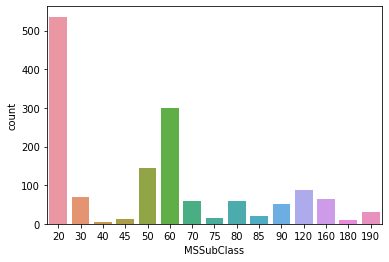

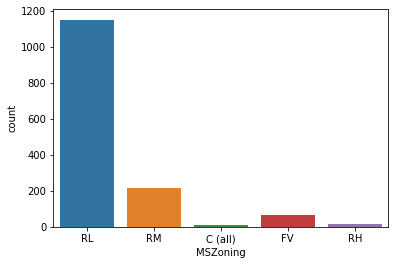

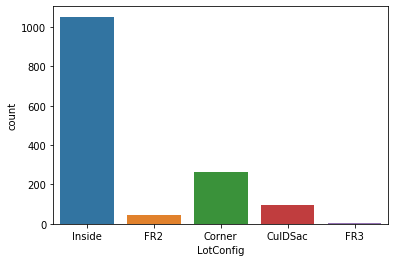

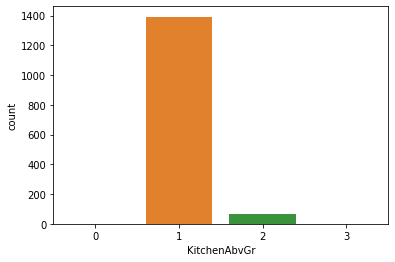

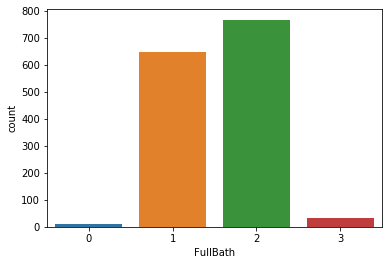

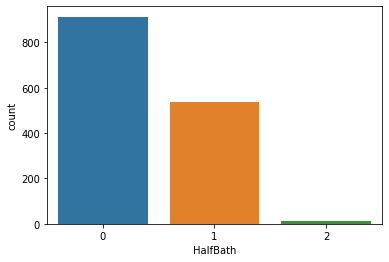

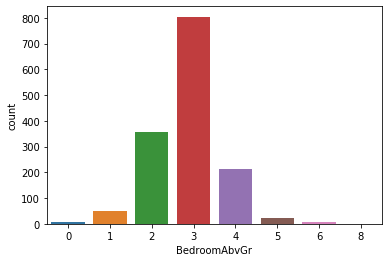

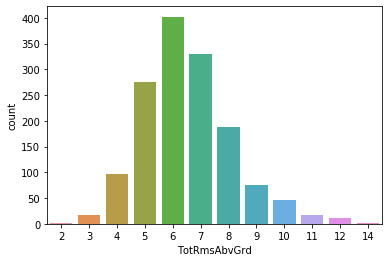

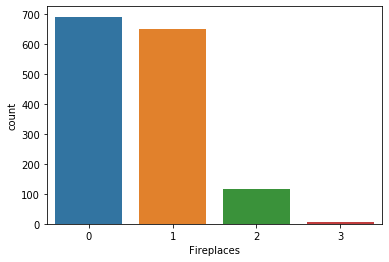

In [82]:
# Count plots
cols = ['MSSubClass', 'MSZoning', 'LotConfig', 'KitchenAbvGr', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'TotRmsAbvGrd', 'Fireplaces']
for col in cols:
    ax = sns.countplot(data=viz, x=col)
    plt.show()
    

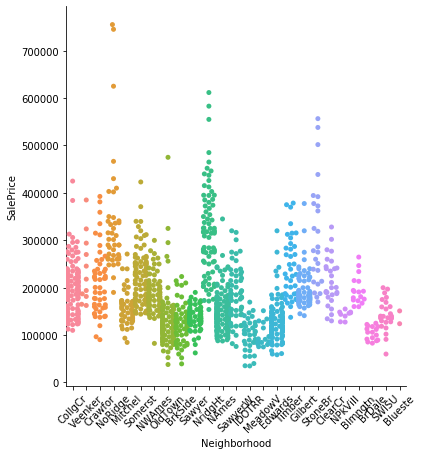

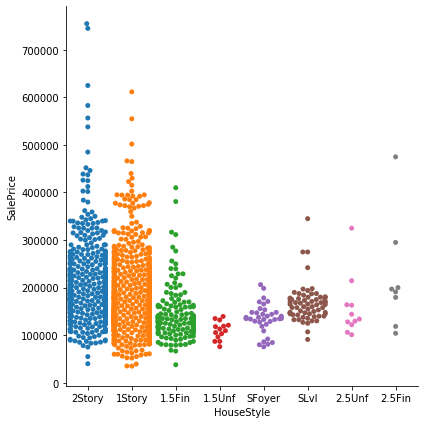

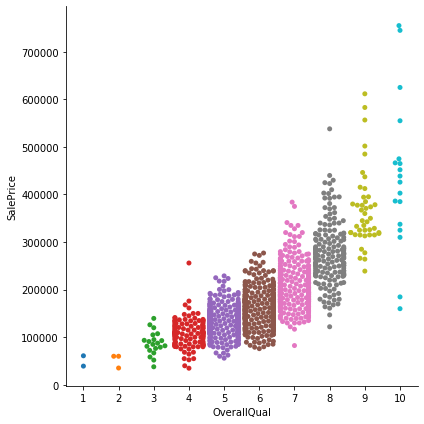

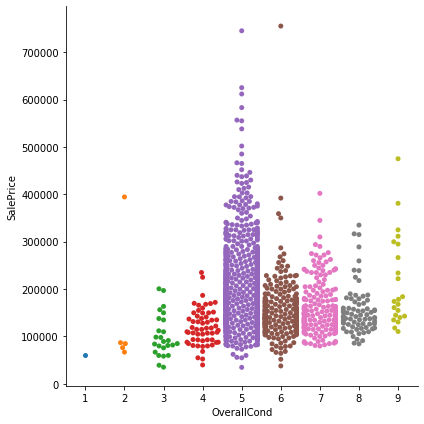

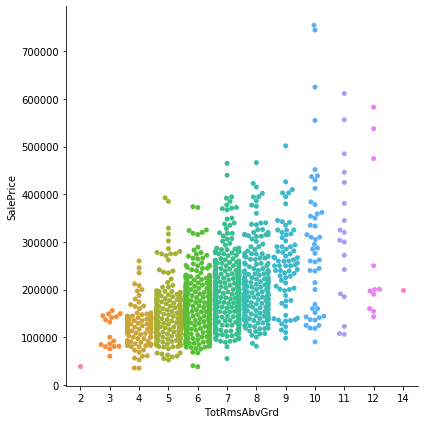

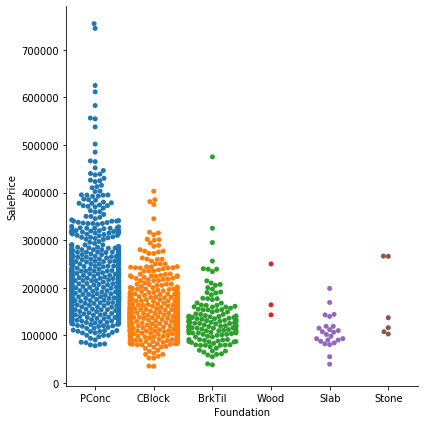

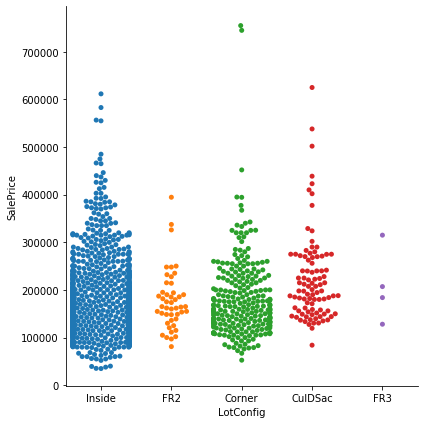

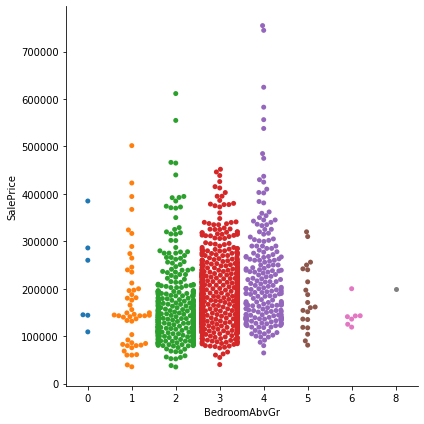

In [83]:
cols = ['Neighborhood', 'HouseStyle', 'OverallQual', 'OverallCond', 'TotRmsAbvGrd', 'Foundation', 'LotConfig', 'BedroomAbvGr']

for col in cols:
    g = sns.catplot(kind="swarm", x=col, y="SalePrice", data=viz, height=6, aspect=1)
    if col == 'Neighborhood':
        g.set_xticklabels(rotation=45)
    else:
        pass
    plt.show()

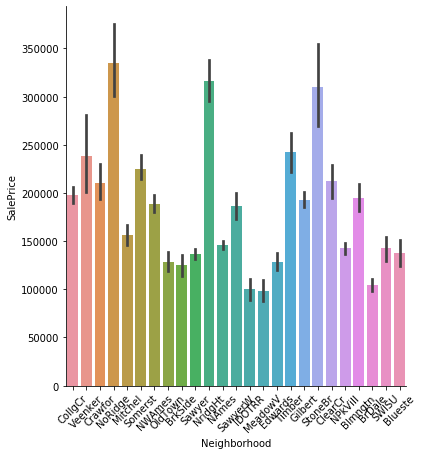

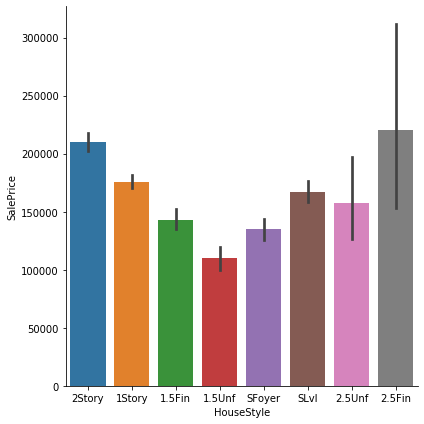

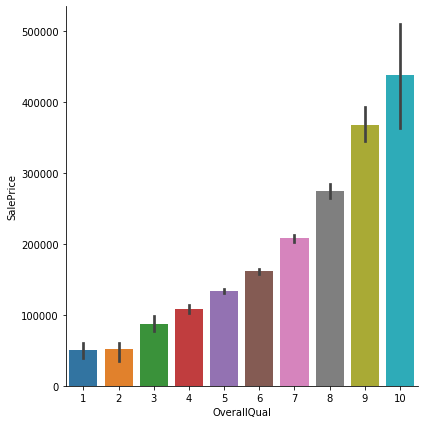

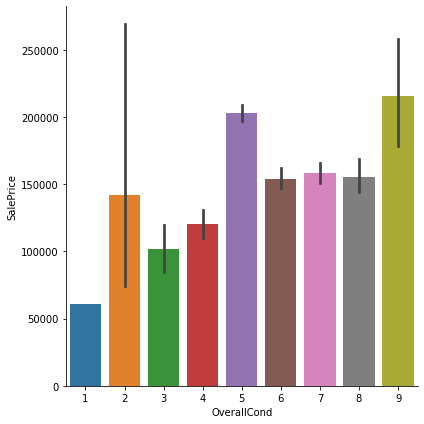

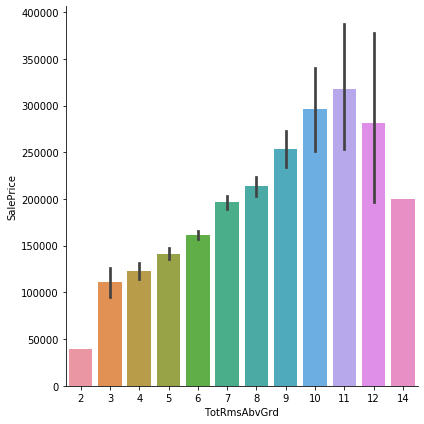

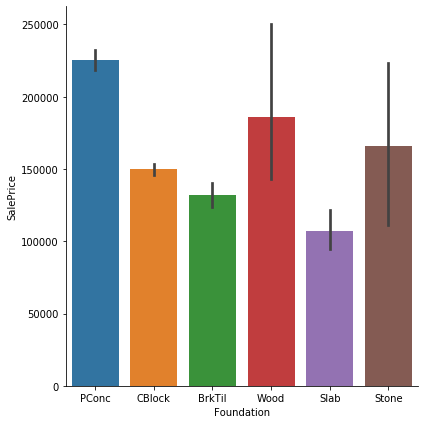

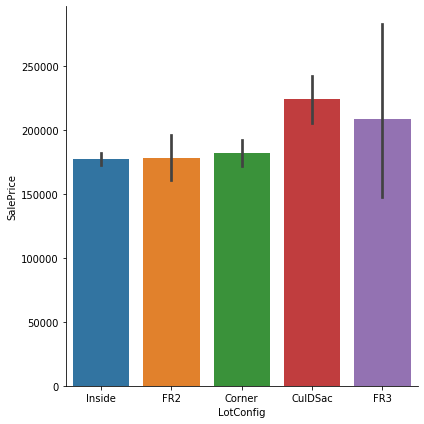

In [84]:
# Bar plots
cols = ['Neighborhood', 'HouseStyle', 'OverallQual', 'OverallCond', 'TotRmsAbvGrd', 'Foundation', 'LotConfig']

for col in cols:
    g = sns.catplot(x=col, y="SalePrice", kind="bar", data=viz, height=6, aspect=1)
    if col == 'Neighborhood':
        g.set_xticklabels(rotation=45)
    else:
        pass
    plt.show()

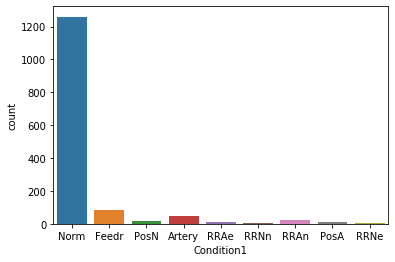

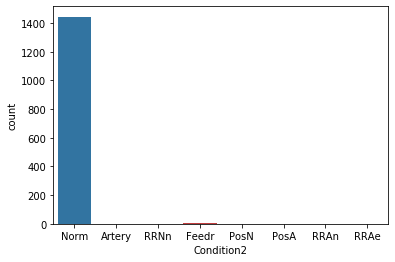

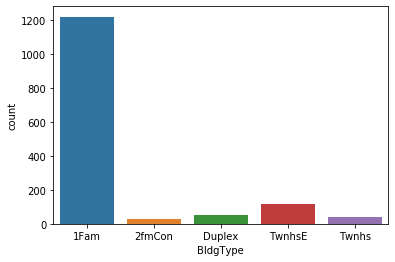

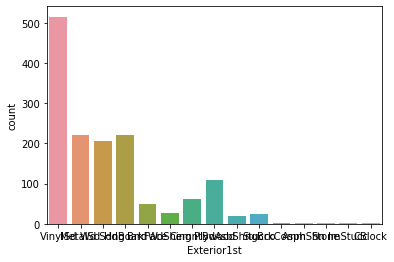

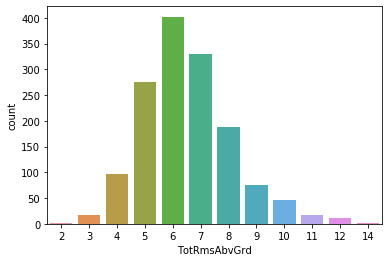

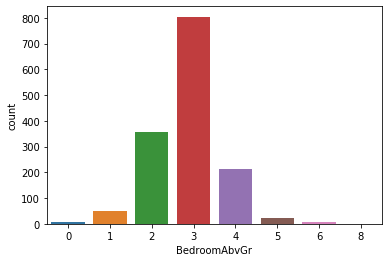

In [85]:
# Count plots
cols = ['Condition1', 'Condition2', 'BldgType', 'Exterior1st', 'TotRmsAbvGrd', 'BedroomAbvGr']
for col in cols:
    ax = sns.countplot(data=viz, x=col)
    plt.show()

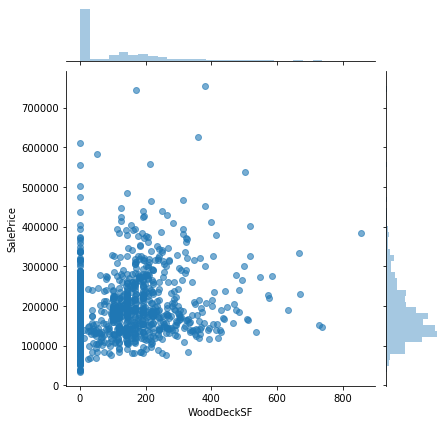

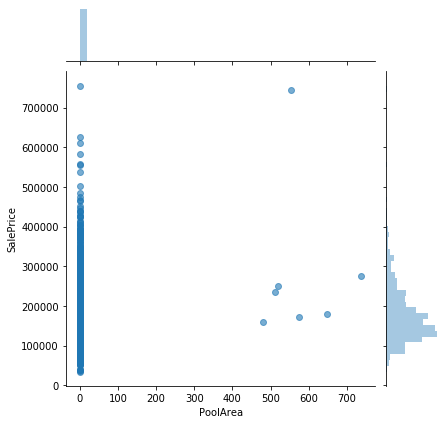

In [86]:
# How to better display this?
# Scatter plots
cols = ['WoodDeckSF', 'PoolArea']
for col in cols:
    sns.jointplot(data=viz, x=col,y='SalePrice', alpha=0.6)
    plt.show()

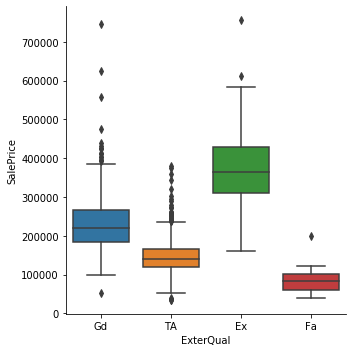

In [87]:
# Box plots
cols = ['ExterQual']
for col in cols:
    g = sns.catplot(data=viz, x=col, y='SalePrice', kind='box')
    if col == 'Neighborhood':
        g.set_xticklabels(rotation=45)
        plt.figure(figsize=(10, 12))
    else:
        pass
    plt.show()

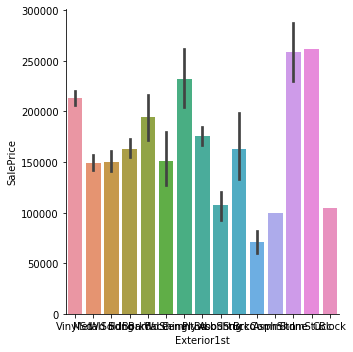

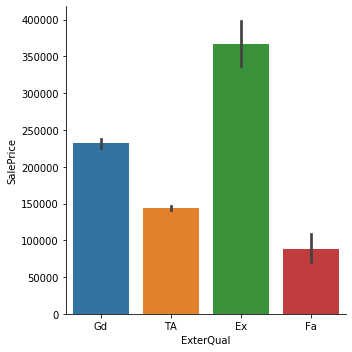

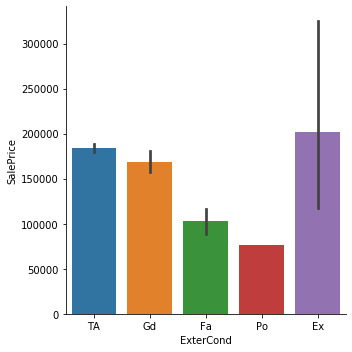

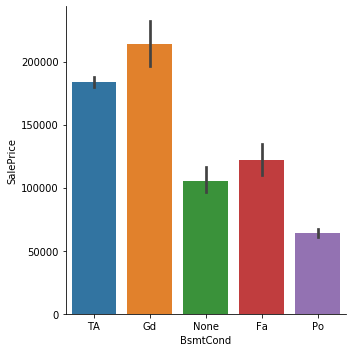

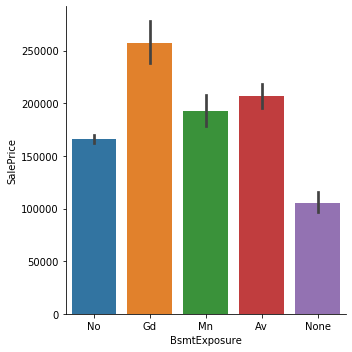

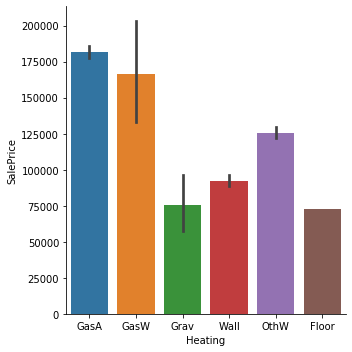

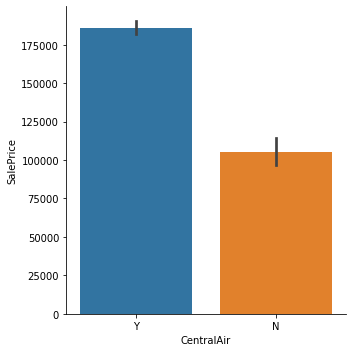

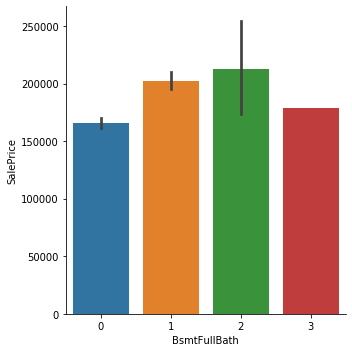

In [88]:
# Bar plots
cols = ['Exterior1st', 'ExterQual', 'ExterCond', 'BsmtCond', 'BsmtExposure', 'Heating', 'CentralAir', 'BsmtFullBath']
for col in cols:
    g = sns.catplot(x=col, y="SalePrice", kind="bar", data=viz)
    plt.show()

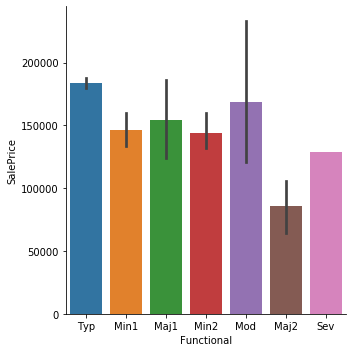

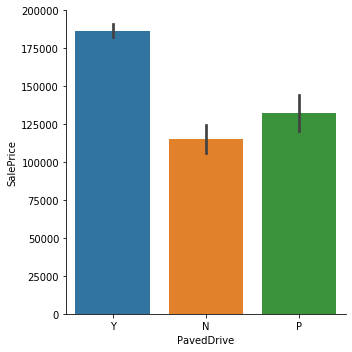

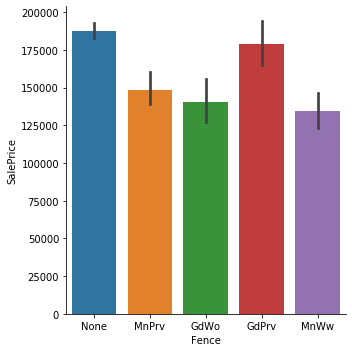

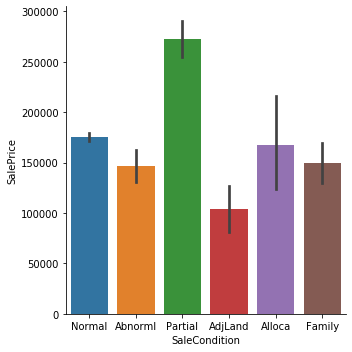

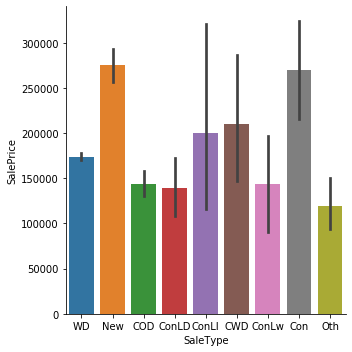

In [89]:
# Bar plots
cols = ['Functional', 'PavedDrive', 'Fence', 'SaleCondition', 'SaleType']
for col in cols:
    g = sns.catplot(x=col, y="SalePrice", kind="bar", data=viz)
    plt.show()

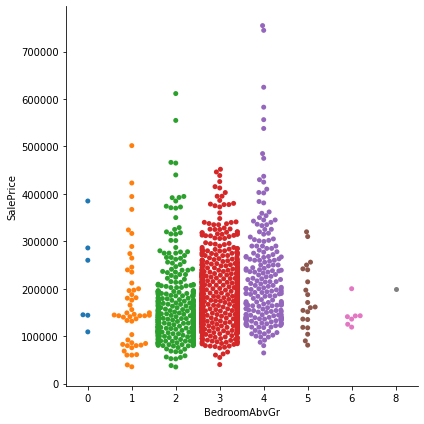

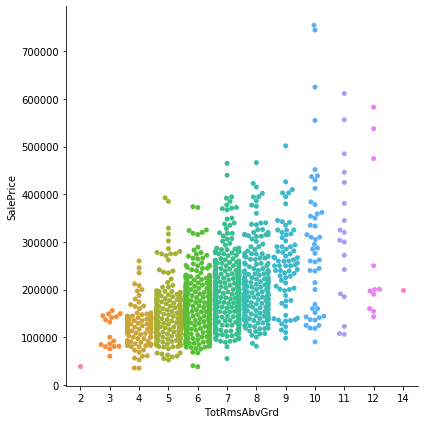

In [90]:
cols = ['BedroomAbvGr', 'TotRmsAbvGrd']

for col in cols:
    g = sns.catplot(kind="swarm", x=col, y="SalePrice", data=viz, height=6, aspect=1)
    if col == 'Neighborhood':
        g.set_xticklabels(rotation=45)
    else:
        pass
    plt.show()

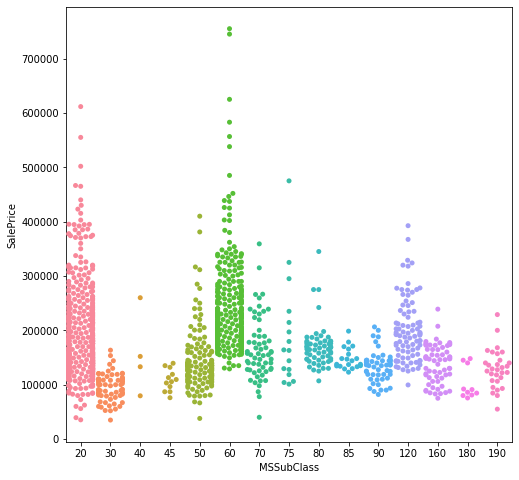

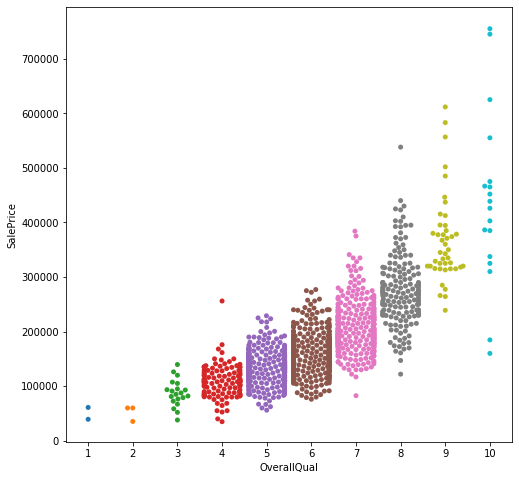

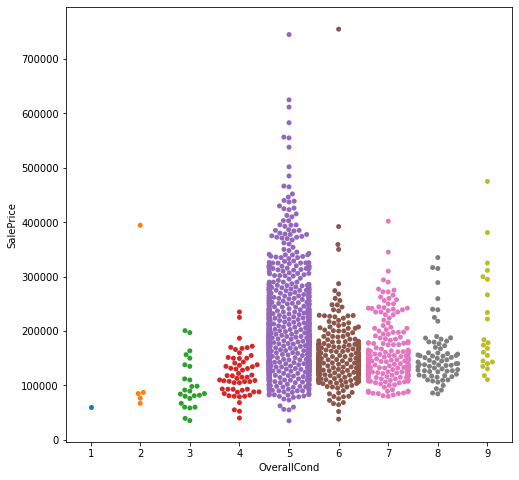

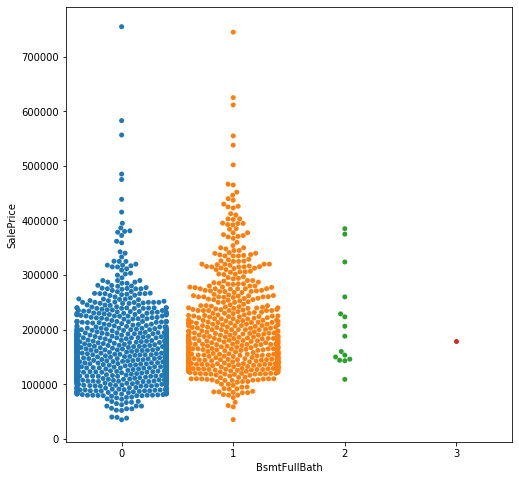

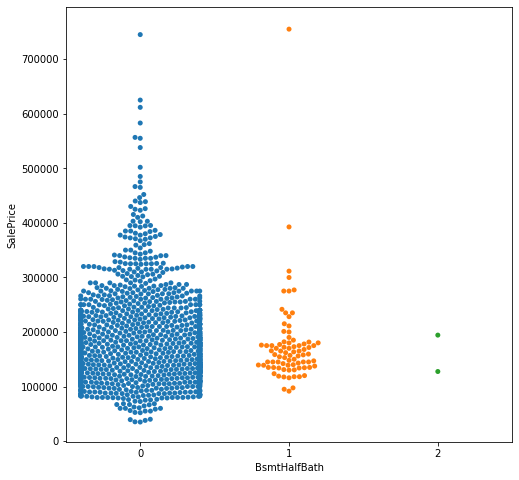

...

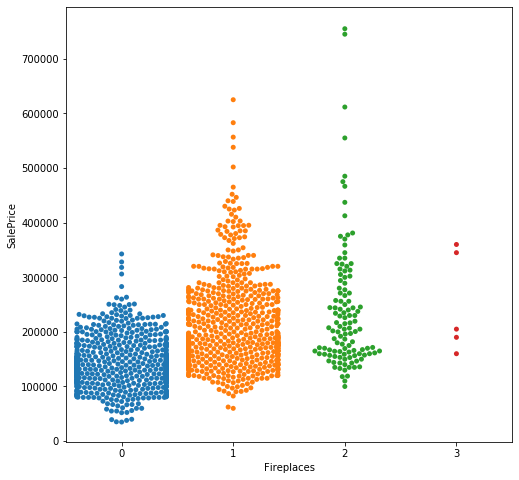

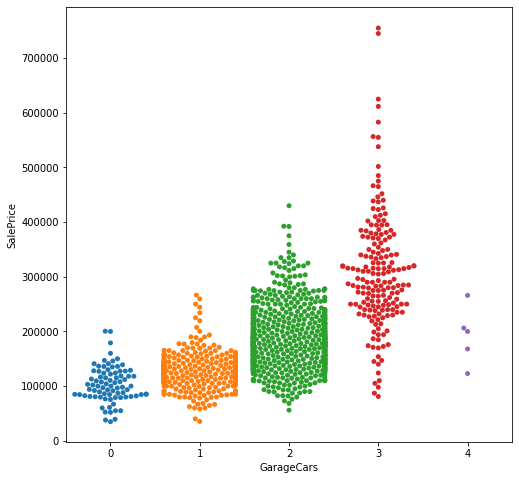

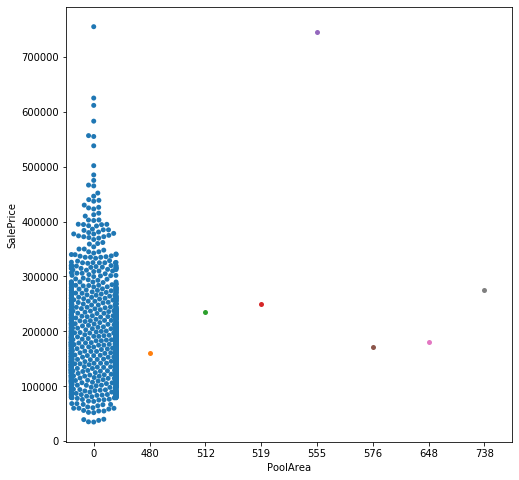

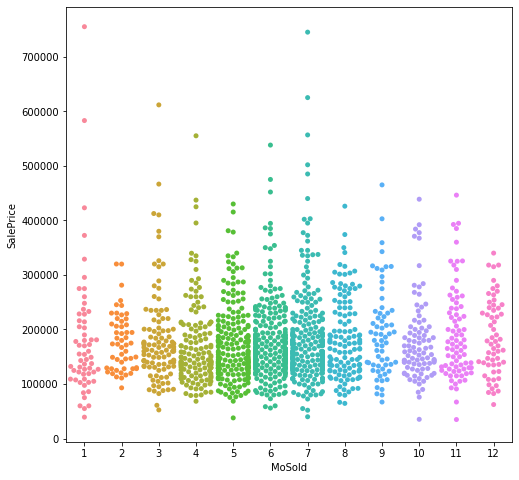

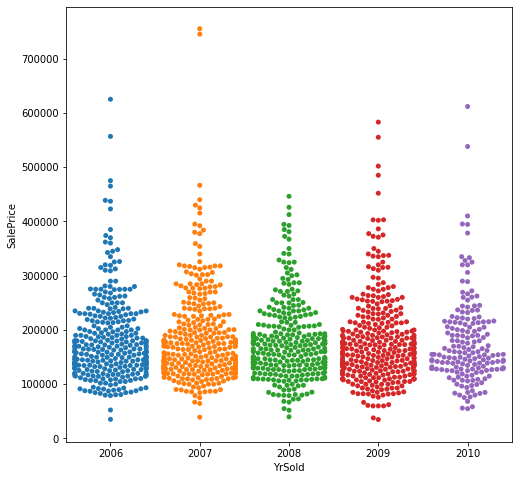

In [91]:
for col in discrete_cols:
    plt.subplots(figsize=(8,8))
    _ = sns.swarmplot(y="SalePrice",x=col,data=viz)

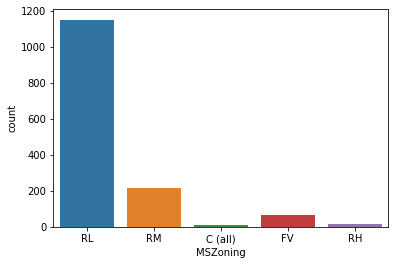

In [92]:
# Count plots
cols = ['MSZoning']
for col in cols:
    ax = sns.countplot(data=viz, x=col)
    plt.show()

In [93]:
categorical_cols = []
numerical_cols = []

for index, value in viz.dtypes.iteritems():
    if value == object:
        categorical_cols.append(index)
    else:
        numerical_cols.append(index)


In [94]:
print(len(categorical_cols), len(numerical_cols))

44 37


In [95]:
continuous_cols = []
discrete_cols = []


for col in numerical_cols:
    sr = pd.Series(viz[col])
    
    # If there are more than 15 unique values in the variable, we can assume it's continuous
    if len(sr.unique()) > 15:
        continuous_cols.append(col)
    else:
        discrete_cols.append(col)

In [96]:
print(len(continuous_cols), len(discrete_cols))

22 15


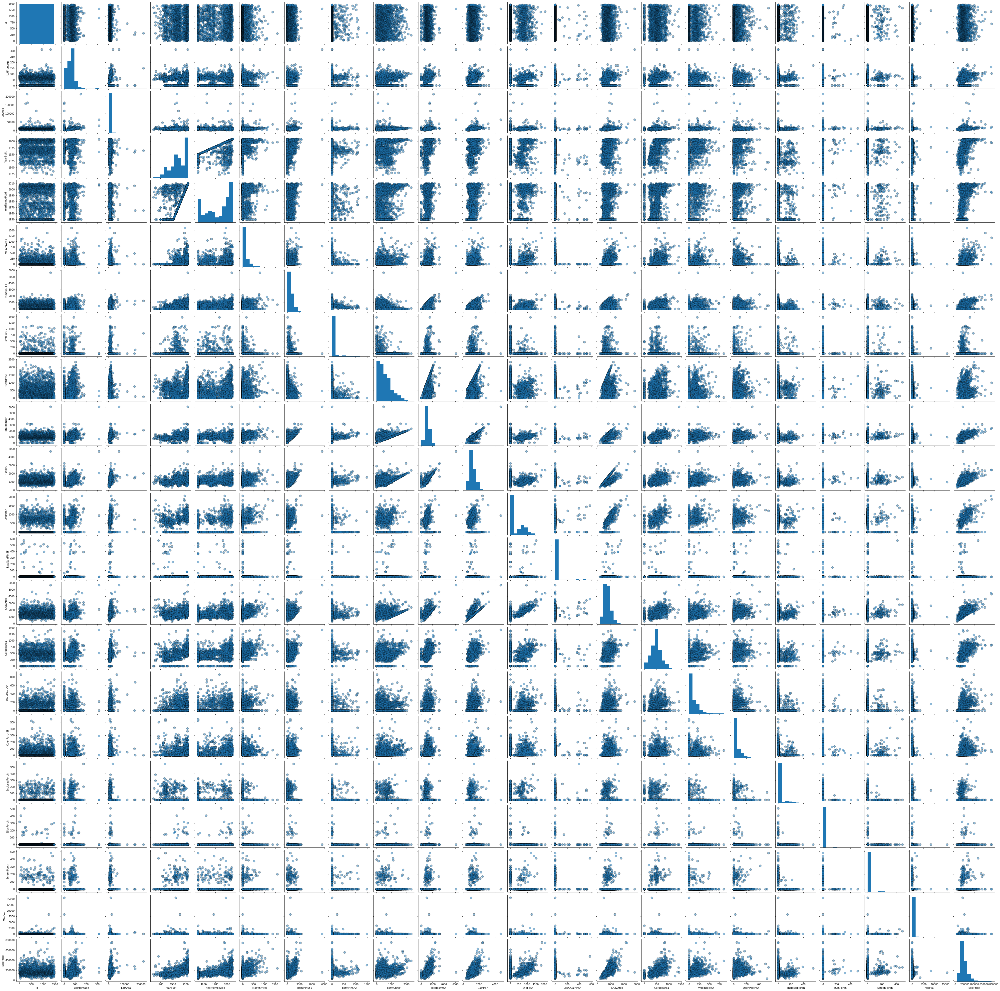

In [97]:
sns.pairplot(viz[continuous_cols], plot_kws = {'alpha': 0.5, 's': 80, 'edgecolor': 'k'})

# What to do with this information?
# Seems easier to filter by actual correlation on the statistics side
# How do you consume so much data?

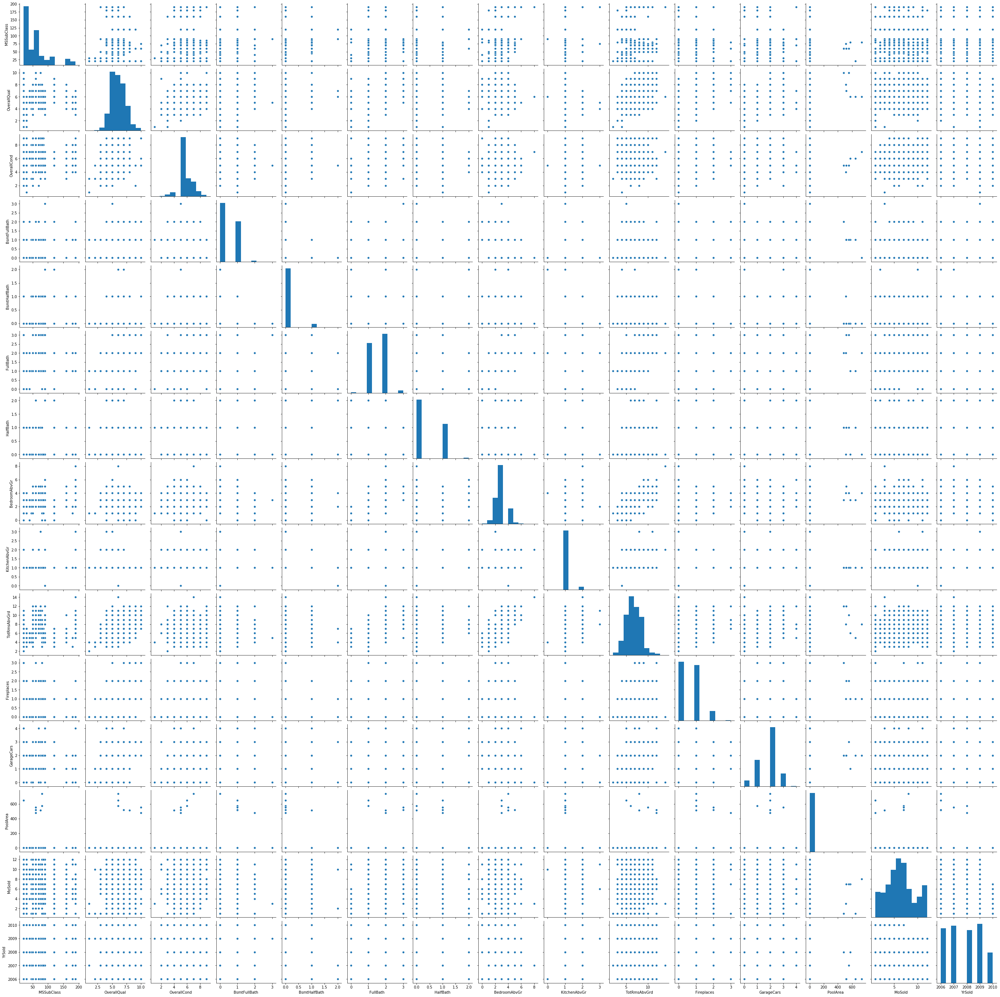

In [98]:
sns.pairplot(viz[discrete_cols])